In [23]:
import pygsheets # use 'pip install pygsheets'
import numpy
import datetime

import pandas
import geopandas
from geopandas.tools import overlay

pandas.set_option('display.max_rows', 100)

import shapely
import cartopy
import matplotlib.pyplot as mp

# terminal data

## import

In [2]:
credentials_directory = '/Users/baird/Dropbox/_google-api/'
gc = pygsheets.authorize(client_secret=credentials_directory+'client_secret.json')
spreadsheet = gc.open_by_key('1tcS6Wd-Wp-LTDpLzFgJY_RSNDnbyubW3J_9HKIAys4A')

#spreadsheet[1] "Gas Pipelines" tab is the second index
terms_df_orig = spreadsheet[1].get_as_df(encoding='latin1')
terms_dict_df = spreadsheet[0].get_as_df(encoding='latin1')
terms_acronyms_df = spreadsheet[7].get_as_df(encoding='latin1')
terms_copyright_df = spreadsheet[8].get_as_df(encoding='latin1')

## clean up

In [3]:
# remove oil export terminals
terms_df_orig = terms_df_orig[terms_df_orig['Type1']!='Oil']
# remove anything without a wiki page
terms_df_orig = terms_df_orig[terms_df_orig['Wiki']!='']

In [4]:
terms_dict_df_include = terms_dict_df.copy()[terms_dict_df.copy()['IncludeWithDataRelease']=='Yes']
terms_dict_df_include = terms_dict_df_include.sort_values('DataReleaseColumnOrder', ascending=True)
terms_dict_df_include = terms_dict_df_include[['VariableName','Definition']]

In [32]:
no_lonlat_options = [
    'Unknown',
    'TBD'
]

## clean up more, create shapely points

In [33]:
# code to create a dataframe with WKT formatted geometry

# (1) copy, clean up
to_convert_df = terms_df_orig.copy()
to_convert_df = to_convert_df[~(to_convert_df['Latitude'].isin(no_lonlat_options)) |
                             ~(to_convert_df['Longitude'].isin(no_lonlat_options))]

# also keep the non-converted ones separate
not_converted_df = terms_df_orig.copy()
not_converted_df = not_converted_df[(not_converted_df['Longitude'].isin(no_lonlat_options)) | 
                                    (not_converted_df['Latitude'].isin(no_lonlat_options))]
# add a dummy column so that the dimensions match with converted wkt pipelines
not_converted_df.assign(ColName='geometry')
not_converted_df['geometry'] = [shapely.geometry.Point()]*not_converted_df.shape[0]
not_converted_df.reset_index(drop=True)
not_converted_gdf = geopandas.GeoDataFrame(not_converted_df, geometry=not_converted_df['geometry'])

# (2) convert all terminals
terms_df_converted = to_convert_df.copy()
terms_df_converted.assign(ColName='geometry')
terms_df_converted['geometry'] = to_convert_df[['Longitude','Latitude']].apply(shapely.geometry.Point, axis=1)
terms_df_converted = terms_df_converted.reset_index(drop=True)

# # (3) store in a GeoDataFrame, attach a projection, transform to a different one
terms_df_gdf = geopandas.GeoDataFrame(terms_df_converted, geometry=terms_df_converted['geometry'])
terms_df_gdf = terms_df_gdf.set_crs('epsg:4326')
terms_df_gdf_4087 = terms_df_gdf.to_crs('epsg:4087')

/Users/baird/miniconda3/envs/gem/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
/Users/baird/miniconda3/envs/gem/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [34]:
all_terms_df = pandas.concat([terms_df_gdf, not_converted_gdf])
all_terms_df = all_terms_df.reset_index(drop=True)
all_terms_df.sort_values('ComboID', inplace=True)

In [35]:
terms_dict_df_sorted = terms_dict_df[terms_dict_df['IncludeWithDataRelease']=='Yes'].sort_values('DataReleaseColumnOrder')
output_columns = terms_dict_df_sorted['VariableName'].tolist()

In [36]:
all_terms_df_to_save = all_terms_df[output_columns]
all_terms_df_to_save_gdf = geopandas.GeoDataFrame(all_terms_df_to_save, geometry=all_terms_df['geometry'])

## save as GeoJSON file

In [37]:
now_string = datetime.datetime.now().strftime('%Y-%m-%d')
filename = 'GEM-LNG-Terminals-dataset-'+now_string+'.geojson'
all_terms_df_to_save_gdf.to_file(filename, driver='GeoJSON')
print('saved as', filename)

saved as GEM-LNG-Terminals-dataset-2022-01-21.geojson


## save as shapefile

In [38]:
now_string = datetime.datetime.now().strftime('%Y-%m-%d')
filename = 'GEM-LNG-Terminals-dataset-'+now_string+'.shp'
all_terms_df_to_save_gdf.to_file(filename, driver='GeoJSON')
print('saved as', filename)

saved as GEM-LNG-Terminals-dataset-2022-01-21.shp


In [39]:
# remove oil export terminals
terms_df_orig = terms_df_orig[terms_df_orig['Type1']!='Oil']
# remove anything without a wiki page
terms_df_orig = terms_df_orig[terms_df_orig['Wiki']!='']

In [40]:
terms_dict_df_include = terms_dict_df.copy()[terms_dict_df.copy()['IncludeWithDataRelease']=='Yes']
terms_dict_df_include = terms_dict_df_include.sort_values('DataReleaseColumnOrder', ascending=True)
terms_dict_df_include = terms_dict_df_include[['VariableName','Definition']]

In [41]:
terms_df_subset = terms_df_orig.copy()[terms_dict_df_include['VariableName'].tolist()]

# pipeline data

## import

In [5]:
#fuel_type = 'Gas'
#fuel_type = 'Oil'
fuel_type = 'Oil-and-Gas'

credentials_directory = '/Users/baird/Dropbox/_google-api/'
gc = pygsheets.authorize(client_secret=credentials_directory+'client_secret.json')

spreadsheet = gc.open_by_key('1foPLE6K-uqFlaYgLPAUxzeXfDO5wOOqE7tibNHeqTek')
#spreadsheet[1] "Gas Pipelines" tab is the second index
gas_pipes = spreadsheet[1].get_as_df()
oil_pipes = spreadsheet[2].get_as_df()
#owners = spreadsheet[3].get_as_df()

pipes_dict_df = spreadsheet[0].get_as_df(encoding='latin1')

#gas_pipes = gas_pipes.drop('WKTFormat', axis=1) # delete WKTFormat column
#oil_pipes = oil_pipes.drop('WKTFormat', axis=1)
#pipes_df_orig = pandas.concat([oil_pipes, gas_pipes], ignore_index=True)

if fuel_type == 'Gas':
    pipes_df_orig = gas_pipes.copy() #pandas.concat([oil_pipes, gas_pipes], ignore_index=True)
if fuel_type == 'Oil':
    pipes_df_orig = oil_pipes.copy()
if fuel_type == 'Oil-and-Gas':
    pipes_df_orig = pandas.concat([oil_pipes, gas_pipes], ignore_index=True)


## clean up

In [6]:
# clean up rows that should not be distributed
pipes_df_orig = pipes_df_orig[pipes_df_orig['Status']!='N/A']
pipes_df_orig = pipes_df_orig[pipes_df_orig['PipelineName']!='']

In [7]:
status_in_dev = ['Proposed', 
                 'Construction', 
                 'Shelved', 'Operating', 
                 'Mothballed', 
                 'Cancelled', 
                 'Retired', 
                 'Idle']
no_route_options = [
    'Unavailable', 
    'Capacity expansion only', 
    'Bidirectionality upgrade only',
    'Short route (< 100 km)', 
    'N/A',
    ''
]

# filter for the statuses above in the status_in_dev list (modify as desired)
#gas_pipes = gas_pipes[gas_pipes['Status'].str.lower().isin(status_in_dev)]

## convert pipeline data to geodata info

In [8]:
def convert_gfit_to_linestring(coord_str, pipeline_name):
    '''
    Takes string from GFIT column of coordinates for a single pipeline,
    converts that string into Shapely LineString or MultiLinestring.
    '''
    #print(coord_str, pipeline_name)
    if ':' in coord_str and ';' not in coord_str:
        # simple geometry; no branching
        # create nested list of lists, separating on colons        
        coord_list = coord_str.split(':')
        coord_list_tuples = []
        # non-branched pipeline (nested list with one level)
        # convert nested list of lists to list of tuples
        try:
            for element in coord_list:
                element_tuple = (float(element.split(',')[1]), 
                                 float(element.split(',')[0]))
                coord_list_tuples.append(element_tuple)
        except:
            print(f"Exception for {pipeline_name}; element: {element}") # for db
        route_conv = shapely.geometry.LineString(coord_list_tuples)

    elif ':' in coord_str and ';' in coord_str:
        # create a nested list of lists, separating on semicolons
        coord_list = coord_str.split(';')   
        # create a second level of nesting, separating on colons
        coord_list = [x.split(':') for x in coord_list]
        # branched pipeline (nested list with two levels)
        route_conv_list_all = []
        
        for nested_list in coord_list:
            coord_list_tuples = []
            # process element
            try:
                for element in nested_list:
                    element_tuple = (float(element.split(',')[1]), 
                                     float(element.split(',')[0]))
                    coord_list_tuples.append(element_tuple)
            except:
                print(f"Exception for {pipeline_name}; element: {element}") # for db
            # process coord_list_tuples
            try:
                route_conv_list = shapely.geometry.LineString(coord_list_tuples)
                route_conv_list_all.append(route_conv_list)
            except:
                print(f"Exception for {pipeline_name}; coord_list_tuples: {coord_list_tuples}") # for db
                pass
            
        route_conv = shapely.geometry.MultiLineString(route_conv_list_all)
        
    return route_conv

In [9]:
def convert_all_pipelines(df):
    """
    Apply the conversion function to all pipelines in the dataframe.
    """
    # create geometry column with empty strings
    #df.assign(ColName='geometry', dtype='str')
    df['geometry'] = ''
    #print(df['geometry'])
    
    # filter to keep only pipelines with routes
    mask_route = df['Route'].str.contains(',' or ':')
    pipes_with_route = df.loc[mask_route]
    
    for row in pipes_with_route.index:
        route_str = df.at[row, 'Route']
        pipeline_name = df.at[row, 'PipelineName']
        
        route_str_converted = convert_gfit_to_linestring(route_str, pipeline_name)
    
        #print(df.at[row,'ProjectID'])
        #print(pipeline_name)
        #print(route_str_converted)
        
        df.at[row, 'geometry'] = route_str_converted   
        
    return df

## clean up more

In [10]:
# code to create a dataframe with WKT formatted geometry

# (1) copy, clean up
to_convert_df = pipes_df_orig.copy()
to_convert_df = to_convert_df[~to_convert_df['Route'].isin(no_route_options)]

# also keep the non-converted ones separate
not_converted_df = pipes_df_orig.copy()
not_converted_df = not_converted_df[not_converted_df['Route'].isin(no_route_options)]
# add a dummy column so that the dimensions match with converted wkt pipelines
not_converted_df.assign(ColName='geometry')
not_converted_df['geometry'] = [shapely.geometry.MultiLineString()]*not_converted_df.shape[0]
not_converted_df.reset_index(drop=True)
not_converted_gdf = geopandas.GeoDataFrame(not_converted_df, geometry=not_converted_df['geometry'])

# (2) convert all pipelines
pipes_df_wkt = convert_all_pipelines(to_convert_df)
pipes_df_wkt = pipes_df_wkt.reset_index(drop=True)

# (3) store in a GeoDataFrame, attach a projection, transform to a different one
pipes_df_wkt_gdf = geopandas.GeoDataFrame(pipes_df_wkt, geometry=pipes_df_wkt['geometry'])
pipes_df_wkt_gdf = pipes_df_wkt_gdf.set_crs('epsg:4326')
pipes_df_wkt_gdf_4087 = pipes_df_wkt_gdf.to_crs('epsg:4087')

/Users/baird/miniconda3/envs/gem/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values


## concatenate "no route options" back to have full dataset for export

In [16]:
all_pipes_df = pipes_df_wkt_gdf.copy() #pandas.concat([pipes_df_wkt_gdf, not_converted_gdf])
all_pipes_df = all_pipes_df.reset_index(drop=True)
all_pipes_df.sort_values('ProjectID', inplace=True)

In [17]:
pipes_dict_df_sorted = pipes_dict_df[(pipes_dict_df['IncludeWithDataRelease']=='Yes') &
                                     (pipes_dict_df['GasVariable']=='Yes')].sort_values('DataReleaseColumnOrder')
output_columns = pipes_dict_df_sorted['VariableName'].tolist()

In [45]:
all_pipes_gdf = geopandas.GeoDataFrame(all_pipes_df[output_columns], geometry=all_pipes_df['geometry'])

# visualize pipelines

In [127]:
solar_orange = '#cb4b16'
solar_base03 = '#002b36'
solar_base1 = '#93a1a1'
report_red = '#bd452a'
solar_base3 = '#fdf6e3'
solar_base01 = '#586e75'
solar_base2 = '#fdf6e3'

In [71]:
all_pipes_gdf_indev = all_pipes_gdf.loc[all_pipes_gdf.Status.isin(['Construction','Proposed'])]
all_pipes_gdf_rest = all_pipes_gdf.loc[~all_pipes_gdf.Status.isin(['Construction','Proposed'])]

In [134]:
countries_gdf = geopandas.read_file('/Users/baird/Dropbox/_gem-gis-data/natural-earth-data/ne_50m_admin_0_countries_lakes/ne_50m_admin_0_countries_lakes.shp')

In [141]:
countries_gdf['geometry']

0      MULTIPOLYGON (((31.28789 -22.40205, 31.19727 -...
1      MULTIPOLYGON (((30.39609 -15.64307, 30.25068 -...
2      MULTIPOLYGON (((53.08564 16.64839, 52.58145 16...
3      MULTIPOLYGON (((104.06396 10.39082, 104.08301 ...
4      MULTIPOLYGON (((-60.82119 9.13838, -60.94141 9...
                             ...                        
236    POLYGON ((19.34238 41.86909, 19.34551 41.91885...
237    POLYGON ((66.52227 37.34849, 66.82773 37.37129...
238    POLYGON ((77.04863 35.10991, 77.00449 35.19634...
239    MULTIPOLYGON (((-45.71777 -60.52090, -45.49971...
240    POLYGON ((-63.12305 18.06895, -63.01118 18.068...
Name: geometry, Length: 241, dtype: geometry

/var/folders/h5/nfk59_vx7gg_58myc9jfk7_40000gn/T/ipykernel_36595/1572793549.py:23: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax.outline_patch.set_visible(False)
/Users/baird/miniconda3/envs/gem/lib/python3.9/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/Users/baird/miniconda3/envs/gem/lib/python3.9/site-packages/cartopy/crs.py:836: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/Users/baird/miniconda3/envs/gem/lib/python3.9/site-packages/cartopy/crs.py:836: Shapel

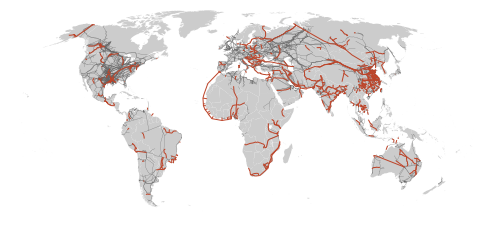

In [158]:
#map_proj = cartopy.crs.PlateCarree()
#map_proj = cartopy.crs.Mollweide()
map_proj = cartopy.crs.Robinson(central_longitude=11.5)
data_proj = cartopy.crs.PlateCarree()

fig = mp.figure(figsize=(6.83,4))
#fig = mp.figure(figsize=(20,10))

ax = fig.add_subplot(111, projection=map_proj)
#ax.coastlines(resolution='50m')
#ax.set_extent([-200,160,-60,70], crs=map_proj)

#ax.add_feature(cartopy.feature.LAND, color=solar_base2)

ax.add_geometries(countries_gdf.loc[countries_gdf.SOVEREIGNT!='Antarctica']['geometry'], facecolor='0.8', edgecolor='None', crs=data_proj)

ax.add_geometries(all_pipes_gdf_rest['geometry'], crs=data_proj, facecolor='None', edgecolor='0.4', linewidth=0.25)
ax.add_geometries(all_pipes_gdf_indev['geometry'], crs=data_proj, facecolor='None', edgecolor=report_red, linewidth=1)

fig.tight_layout()

# turn off outline
ax.outline_patch.set_visible(False)

fig.savefig('Pipe-Dreams-cover-art-map.pdf', bbox_inches='tight', transparent=True)

In [ ]:
# get country borders
resolution = '10m'
category = 'cultural'
name = 'admin_0_countries'

shpfilename = shapereader.natural_earth(resolution, category, name)

# read the shapefile using geopandas
df = geopandas.read_file(shpfilename)

# read the german borders
poly = df.loc[df['ADMIN'] == 'Germany']['geometry'].values[0]

In [ ]:
#map_proj = cartopy.crs.PlateCarree()
#map_proj = cartopy.crs.Mollweide()
map_proj = cartopy.crs.Robinson(central_longitude=11.5)
data_proj = cartopy.crs.PlateCarree()

fig = mp.figure(figsize=(6.83,4))
#fig = mp.figure(figsize=(20,10))

ax = fig.add_subplot(111, projection=map_proj)
#ax.coastlines(resolution='50m')
#ax.set_extent([-200,160,-60,70], crs=map_proj)

ax.add_feature(cartopy.feature.LAND, color=solar_base03)

ax.add_geometries(all_pipes_gdf_rest['geometry'], crs=data_proj, facecolor='None', edgecolor=solar_base1, linewidth=0.25)
ax.add_geometries(all_pipes_gdf_indev['geometry'], crs=data_proj, facecolor='None', edgecolor=report_red, linewidth=1)

fig.tight_layout()
fig.savefig('cover-art-2.pdf', bbox_inches='tight', transparent=True)

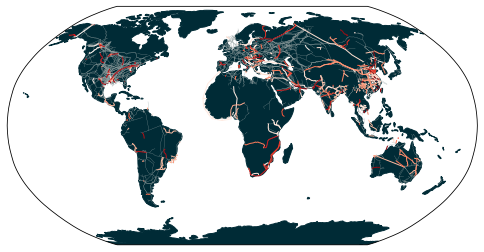

In [122]:
#map_proj = cartopy.crs.PlateCarree()
#map_proj = cartopy.crs.Mollweide()

cmap_to_use = matplotlib.cm.get_cmap('Reds')
cmap_list = list(cmap_to_use(numpy.linspace(0,1,all_pipes_gdf_indev['geometry'].size)))

map_proj = cartopy.crs.Robinson(central_longitude=11.5)
data_proj = cartopy.crs.PlateCarree()

fig = mp.figure(figsize=(6.83,4))
#fig = mp.figure(figsize=(20,10))

ax = fig.add_subplot(111, projection=map_proj)
#ax.coastlines(resolution='50m')
#ax.set_extent([-200,160,-60,70], crs=map_proj)

ax.add_feature(cartopy.feature.LAND, color=solar_base03)

ax.add_geometries(all_pipes_gdf_rest['geometry'], crs=data_proj, facecolor='None', edgecolor=solar_base1, linewidth=0.25)
ax.add_geometries(all_pipes_gdf_indev['geometry'], crs=data_proj, facecolor='None', edgecolor=cmap_list, linewidth=1)

fig.tight_layout()
fig.savefig('cover-art-2.pdf', bbox_inches='tight', transparent=True)

In [19]:
#all_pipes_df_to_save_gdf.explore()

## save as GeoJSON file

## save as shapefile